# MISO exploration

In [1]:
import xarray as xr
import cf_xarray
import xfilter
import matplotlib.pyplot as plt
import numpy as np
import dcpy
plt.rcParams["figure.dpi"] = 120

## EBoB

In [31]:
ebob = xr.load_dataset("../estimates/bay_merged_8n_hourly.nc").squeeze().resample(time="D").mean()
ebob

<xarray.Dataset>
Dimensions:     (depth: 6, lon: 3, time: 427)
Coordinates:
    lat         int64 8
  * depth       (depth) int64 30 45 55 75 84 104
  * lon         (lon) float64 85.5 87.0 88.5
  * time        (time) datetime64[ns] 2013-12-21 2013-12-22 ... 2015-02-20
Data variables: (12/21)
    chi-t       (time, lon, depth) float64 1.019e-08 1.397e-07 nan ... nan 0.0
    epsilon     (time, lon, depth) float64 6.41e-09 1.815e-08 nan ... nan nan
    KT          (time, lon, depth) float64 2.942e-06 3.41e-06 ... nan 1.567e-07
    KS          (time, lon, depth) float64 2.785e-06 3.254e-06 ... nan 1.498e-09
    Jq          (time, lon, depth) float64 -0.4781 -2.125 nan ... nan -0.1318
    Tz          (time, lon, depth) float64 0.06944 0.146 nan ... nan nan 0.1953
    ...          ...
    uz          (time, lon) float64 0.001551 0.003392 nan ... nan nan -0.003875
    wkb_uz      (time, lon) float64 0.001541 0.003884 nan ... nan nan -0.003095
    vz          (time, lon) float64 -0.0108 0.001015 nan ... nan nan 0.002416
    wkb_vz      (time, lon) float64 -0.01073 0.001162 nan ... nan nan 0.00193
    wind_input  (time, lon) float64 nan nan nan nan ... nan nan -0.0001157
    Js          (time, lon, depth) float64 7.447e-05 -5.102e-07 ... 5.715e-09

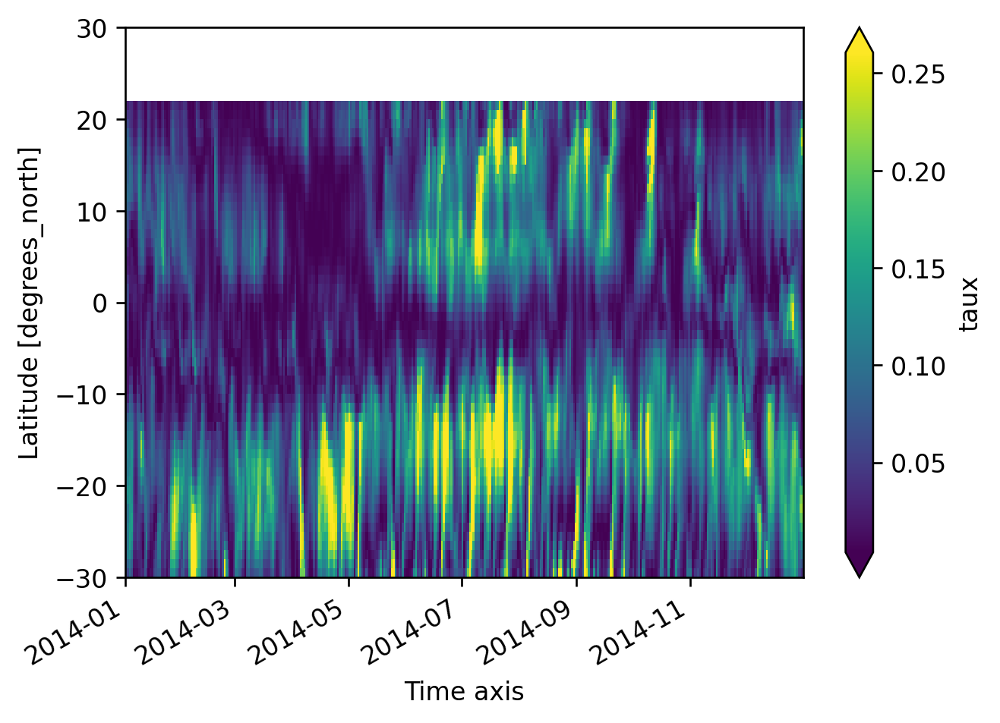

In [3]:
taux = xr.open_dataset("/Users/dcherian/datasets/tropflux/taux_tropflux_1d_2014.nc").taux
tauy = xr.open_dataset("/Users/dcherian/datasets/tropflux/tauy_tropflux_1d_2014.nc").tauy
tau = np.hypot(taux, tauy)
(tau).sel(longitude=slice(85, 90)).mean("longitude").cf.plot(robust=True)

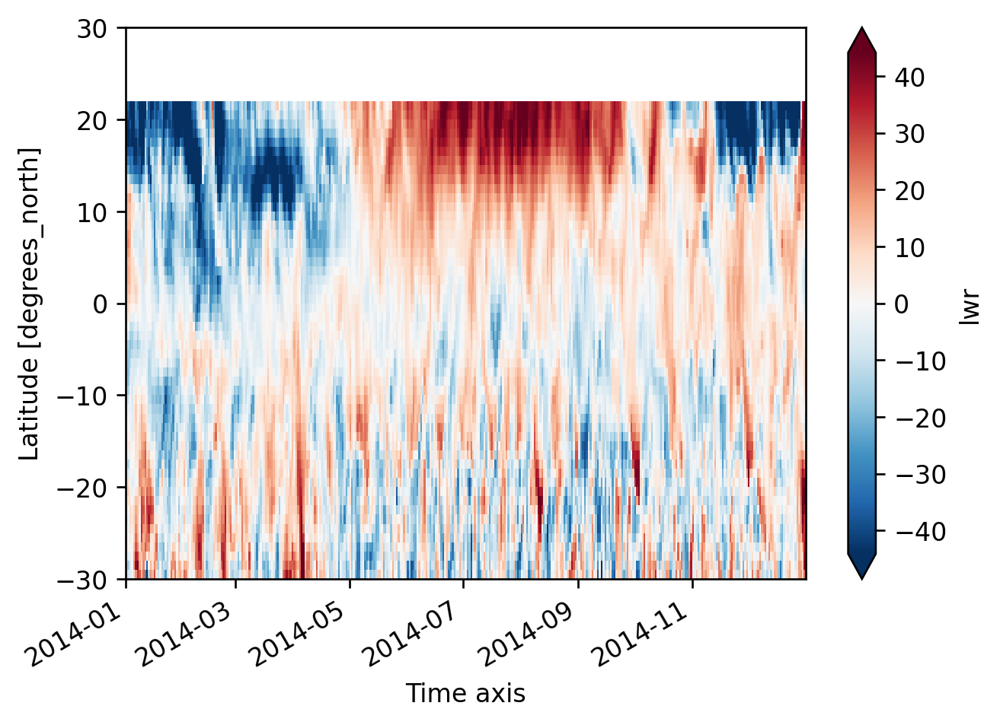

In [4]:
lwr = xr.open_dataset("/Users/dcherian/datasets/tropflux/lwr_tropflux_1d_2014.nc").lwr
(lwr - lwr.mean("time")).sel(longitude=slice(85, 90)).mean("longitude").cf.plot(robust=True)

In [66]:
olr = xr.open_dataset(
    "../datasets/olr-daily_v01r02_20140101_20141231.nc", decode_coords="all"
).olr.sel(lat=slice(-10, 25), lon=slice(55, 100))
olr

<xarray.DataArray 'olr' (time: 365, lat: 35, lon: 45)>
[574875 values with dtype=float32]
Coordinates:
  * lon      (lon) float32 55.5 56.5 57.5 58.5 59.5 ... 95.5 96.5 97.5 98.5 99.5
  * lat      (lat) float32 -9.5 -8.5 -7.5 -6.5 -5.5 ... 20.5 21.5 22.5 23.5 24.5
  * time     (time) datetime64[ns] 2014-01-01T12:00:00 ... 2014-12-31T12:00:00
Attributes:
    long_name:      NOAA Climate Data Record of Daily Mean Upward Longwave Fl...
    standard_name:  toa_outgoing_longwave_flux
    units:          W m-2
    cell_methods:   time: mean area: mean
    valid_min:      50.0
    valid_max:      500.0

In [67]:
clim = olr.groupby("time.month").mean().sel(month=olr.time.dt.month)
olranom = (olr - clim)
clim = tau.groupby("time.month").mean().sel(month=tau.time.dt.month)
tauanom = (tau - clim)

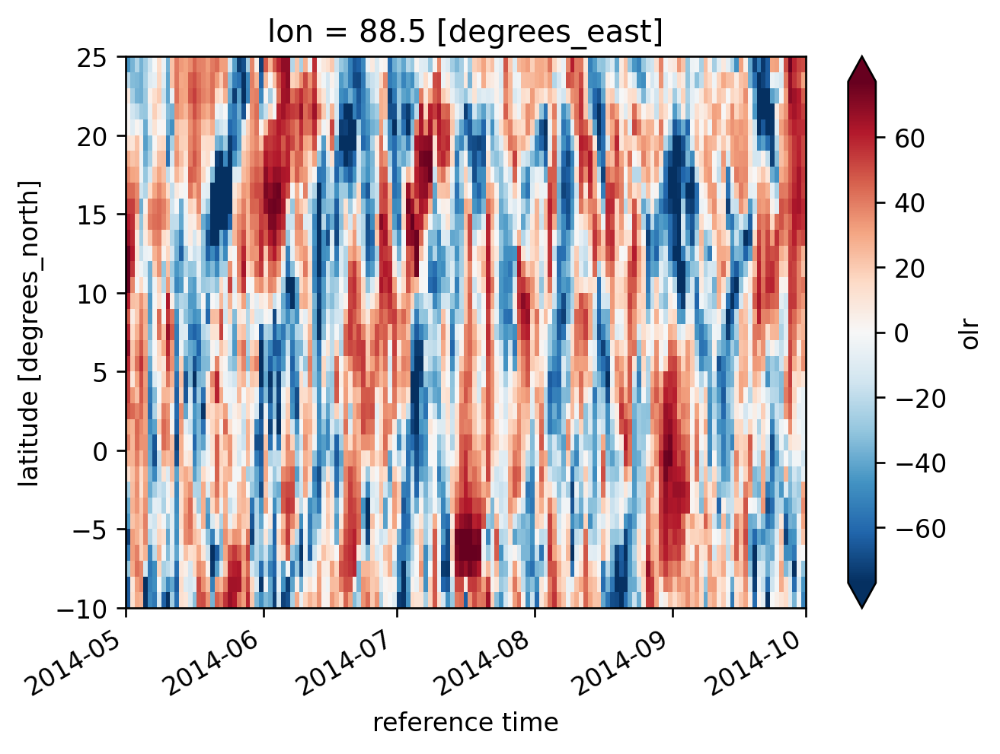

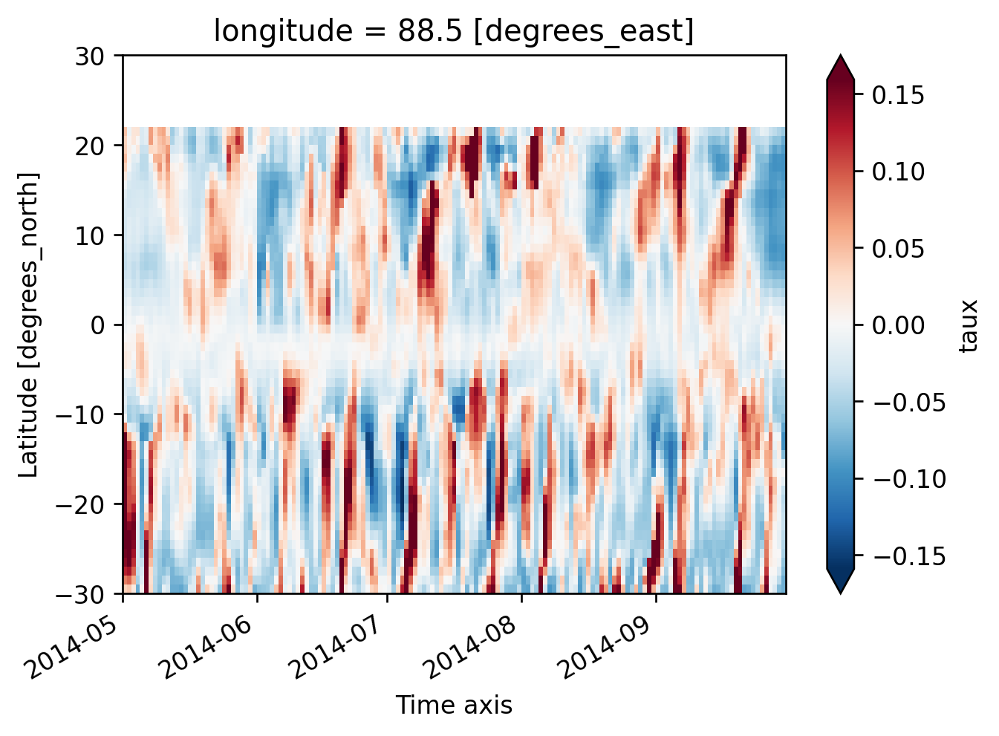

In [68]:
olranom.sel(lon=88, method="nearest").sel(time=slice("2014-05", "2014-09")).cf.plot(
    robust=True
)
plt.figure()
(tauanom).cf.sel(longitude=88, method="nearest").sel(
    time=slice("2014-05", "2014-09")
).cf.plot(robust=True)

([<matplotlib.lines.Line2D at 0x7f7fcdd0b3d0>],
 <AxesSubplot:title={'center':' taux'}, xlabel='Frequency [cpd]', ylabel='PSD'>)

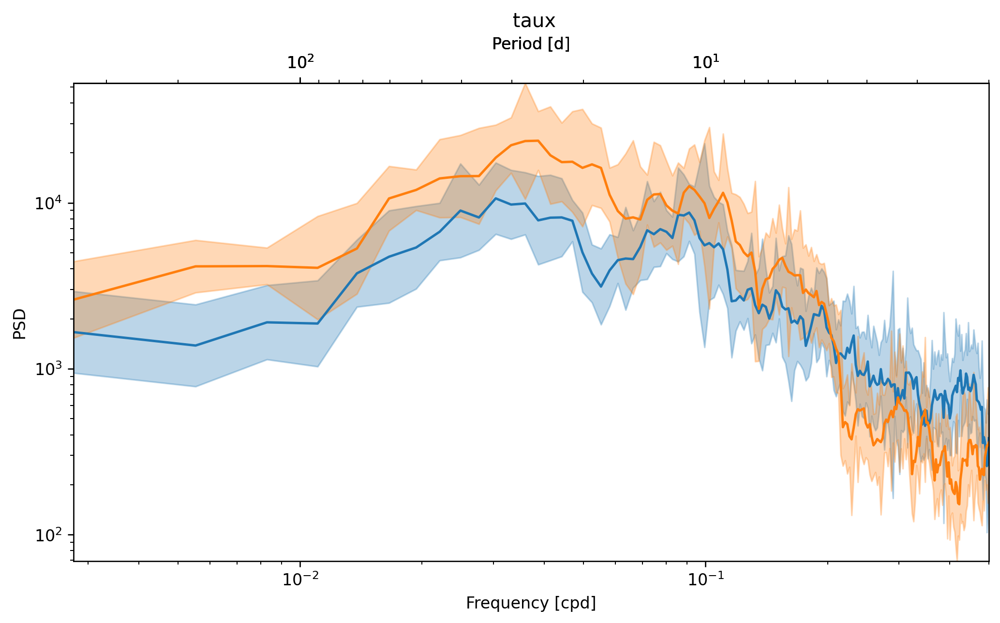

In [15]:
olrts = olranom.sel(lat=8, lon=[88], method="nearest").mean("lon")

_, ax = dcpy.ts.PlotSpectrum(olrts)
dcpy.ts.PlotSpectrum(
    (1000 * tauanom)
    .cf.sel(latitude=10, method="nearest")
    .cf.sel(longitude=[88], method="nearest")
    .cf.mean("longitude"),
    ax=ax,
)

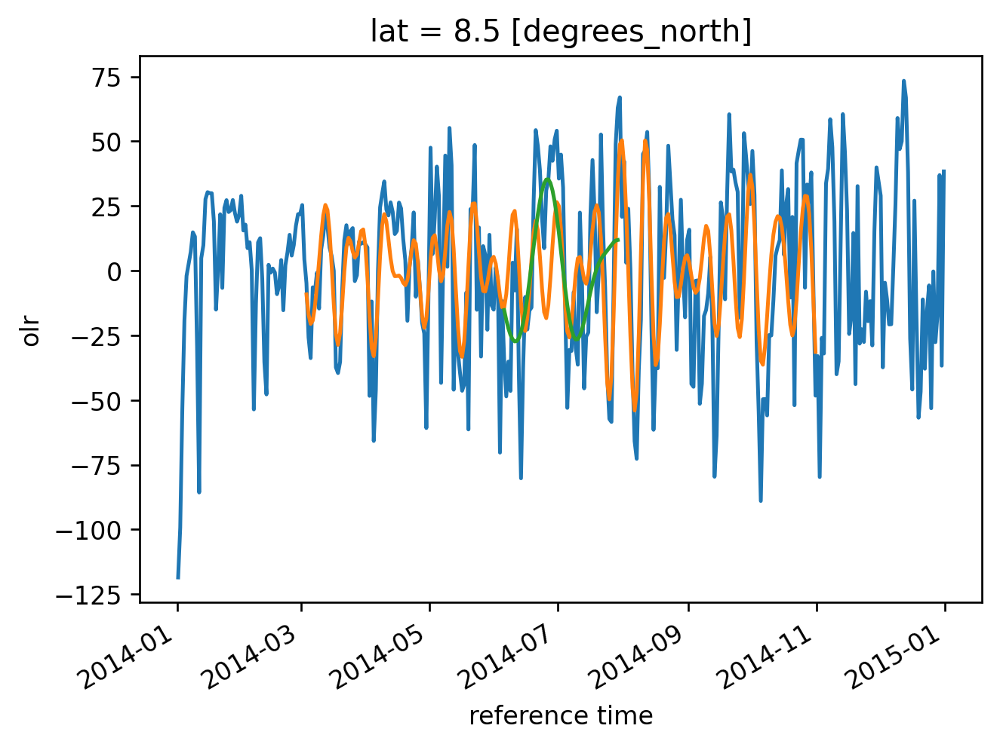

In [22]:
olrts.plot()
xfilter.bandpass(olrts, coord="time", freq=[1 / 20, 1 / 8], cycles_per="D").plot()
xfilter.bandpass(olrts, coord="time", freq=[1 / 50, 1 / 20], cycles_per="D").plot()

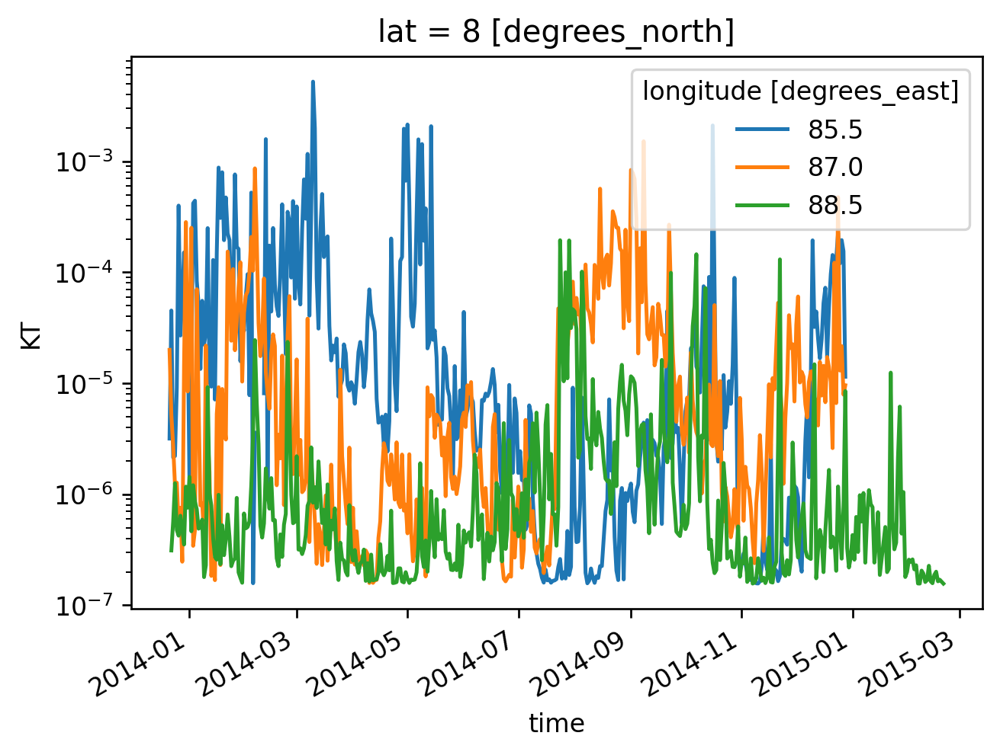

In [38]:
ebob.KT.mean("depth").plot.line(yscale="log", hue="lon")

## RAMA

In [80]:
olr = xr.open_dataset(
    "../datasets/olr-daily_v01r02_20150101_20151231.nc", decode_coords="all"
).olr.sel(lat=slice(-10, 25), lon=slice(55, 100))
clim = olr.groupby("time.month").mean().sel(month=olr.time.dt.month)
olranom = (olr - clim)
olr

<xarray.DataArray 'olr' (time: 365, lat: 35, lon: 45)>
[574875 values with dtype=float32]
Coordinates:
  * lon      (lon) float32 55.5 56.5 57.5 58.5 59.5 ... 95.5 96.5 97.5 98.5 99.5
  * lat      (lat) float32 -9.5 -8.5 -7.5 -6.5 -5.5 ... 20.5 21.5 22.5 23.5 24.5
  * time     (time) datetime64[ns] 2015-01-01T12:00:00 ... 2015-12-31T12:00:00
Attributes:
    long_name:      NOAA Climate Data Record of Daily Mean Upward Longwave Fl...
    standard_name:  toa_outgoing_longwave_flux
    units:          W m-2
    cell_methods:   time: mean area: mean
    valid_min:      50.0
    valid_max:      500.0

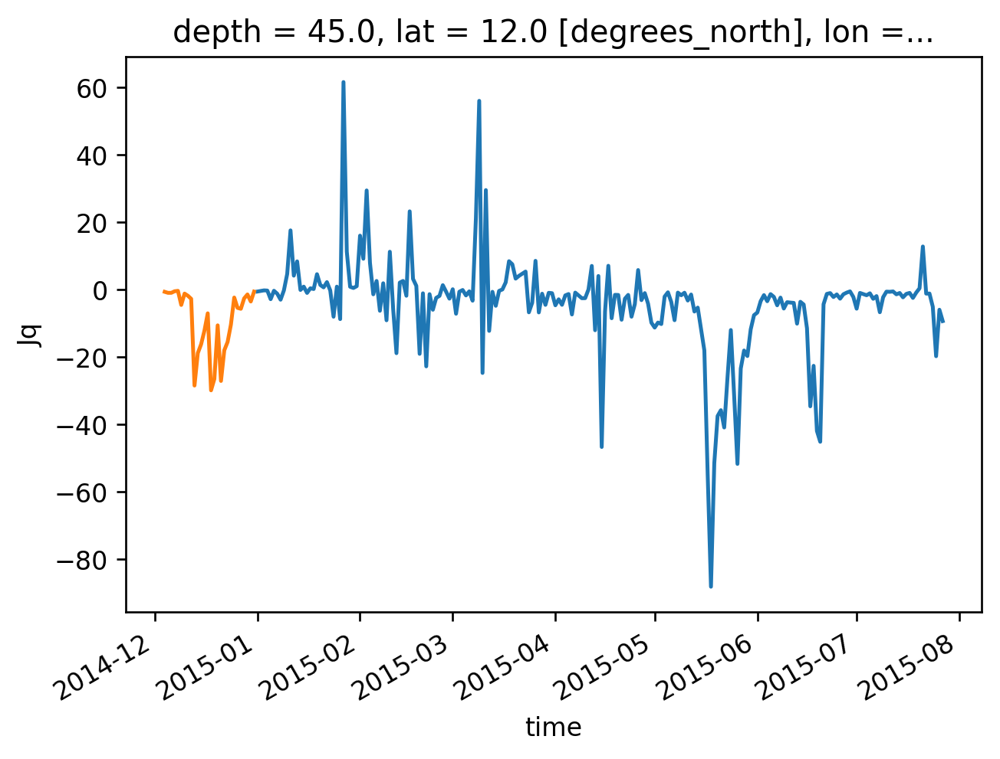

In [201]:
hourly.Jq.sel(lat=12, lon=90, depth=45, time="2015").resample(time="D").mean().plot()
hourly.Jq.sel(lat=12, lon=90, depth=45, time="2014").resample(time="D").mean().plot()

In [192]:
hourly = xr.load_dataset("../estimates/bay_merged_sorted_hourly.nc")
hourly

<xarray.Dataset>
Dimensions:     (time: 19033, depth: 8, lat: 5, lon: 4)
Coordinates:
  * time        (time) datetime64[ns] 2013-11-30 ... 2016-02-01
  * depth       (depth) float64 15.0 30.0 45.0 55.0 69.0 75.0 84.0 104.0
  * lat         (lat) float64 5.0 6.5 8.0 12.0 15.0
  * lon         (lon) float64 85.5 87.0 88.5 90.0
Data variables: (12/22)
    eps         (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan
    Sz          (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan
    Jq          (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan
    KT          (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan
    chi-t       (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan
    Tz          (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan
    ...          ...
    uz          (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    wkb_uz      (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    vz          (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    wkb_vz      (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    wind_input  (time, lat, lon) float64 nan nan nan nan nan ... nan nan nan nan
    Js          (time, lat, lon, depth) float64 nan nan nan nan ... nan nan nan

In [202]:
rama12 = hourly.sel(lon=90, lat=12, depth=slice(45))

In [69]:
import hvplot.xarray

In [160]:
olranom.sel(lat=12, method="nearest").sel(lon=slice(85, 90)).mean("lon").reset_coords(drop=True).hvplot()

:Curve   [time]   (olr)

In [70]:
rama12.mld.hvplot()

:Curve   [time]   (mld)

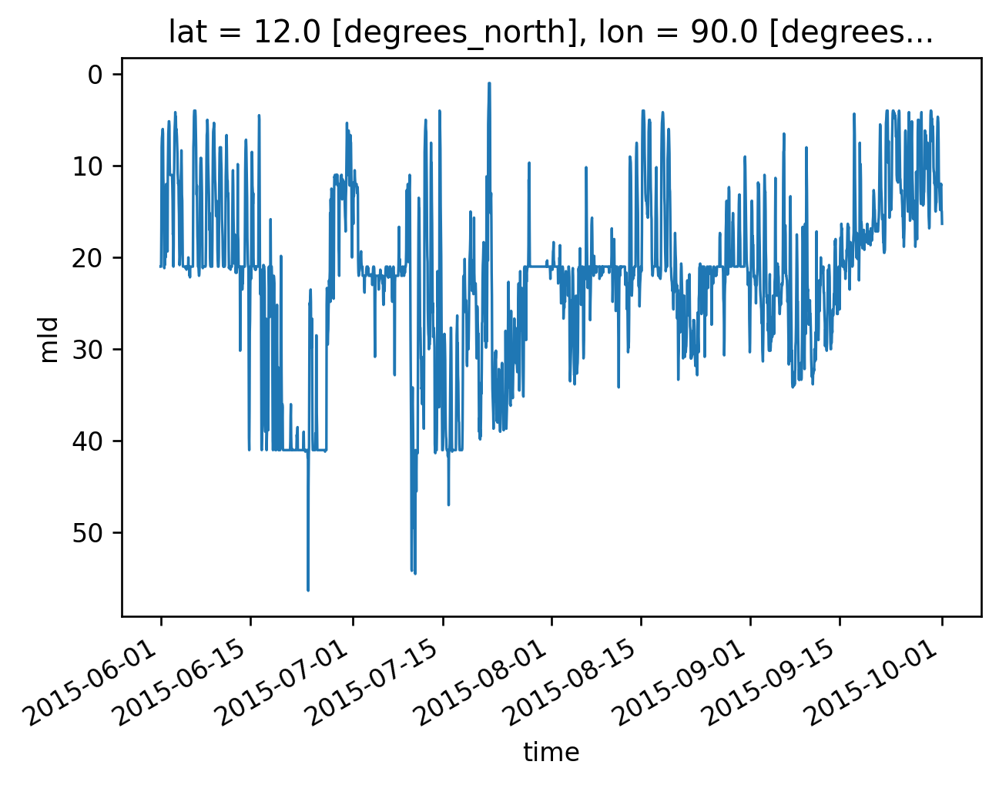

In [65]:
rama12.mld.sel(time=slice("2015-Jun", "2015-Sep")).plot(lw=1, yincrease=False)

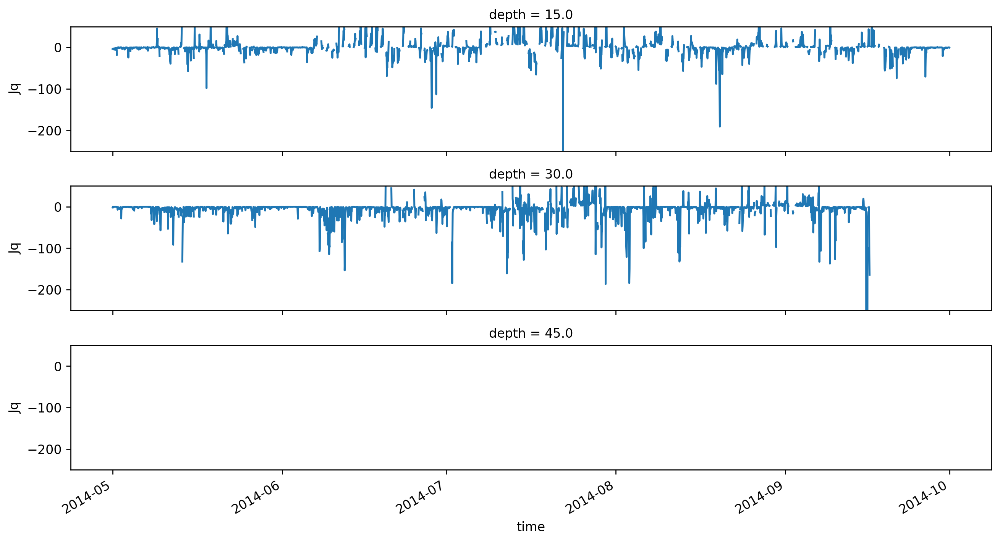

In [203]:
rama12.Jq.sel(time=slice("2014-May", "2014-Sep")).plot(row="depth", aspect=5, size=2, ylim=(-250, 50))

In [208]:
rama12

<xarray.Dataset>
Dimensions:     (time: 19033, depth: 3)
Coordinates:
  * time        (time) datetime64[ns] 2013-11-30 ... 2016-02-01
  * depth       (depth) float64 15.0 30.0 45.0
    lat         float64 12.0
    lon         float64 90.0
Data variables: (12/22)
    eps         (time, depth) float64 1.44e-07 nan nan 2.119e-07 ... nan nan nan
    Sz          (time, depth) float64 -0.001796 nan nan ... nan nan nan
    Jq          (time, depth) float64 2.301 nan nan 2.284 ... nan nan nan nan
    KT          (time, depth) float64 8.62e-05 nan nan 0.00011 ... nan nan nan
    chi-t       (time, depth) float64 7.34e-09 nan nan 6.08e-09 ... nan nan nan
    Tz          (time, depth) float64 -0.00658 nan nan -0.005905 ... nan nan nan
    ...          ...
    uz          (time) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    wkb_uz      (time) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    vz          (time) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    wkb_vz      (time) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    wind_input  (time) float64 nan nan nan ... -4.644e-05 -5.54e-05 -5.987e-05
    Js          (time, depth) float64 0.0001534 nan nan ... nan nan nan

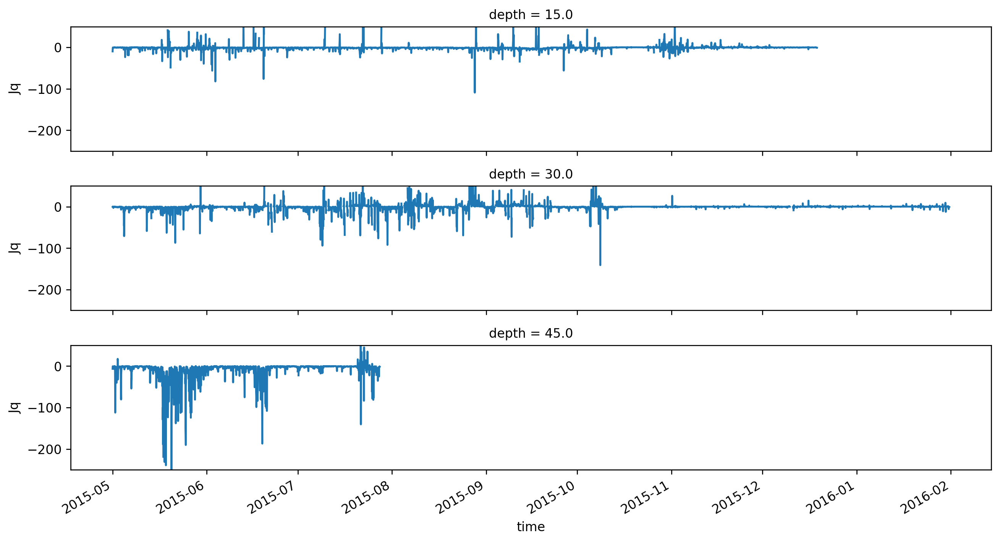

In [206]:
rama12.Jq.sel(time=slice("2015-May", None)).plot(row="depth", aspect=5, size=2, ylim=(-250, 50))

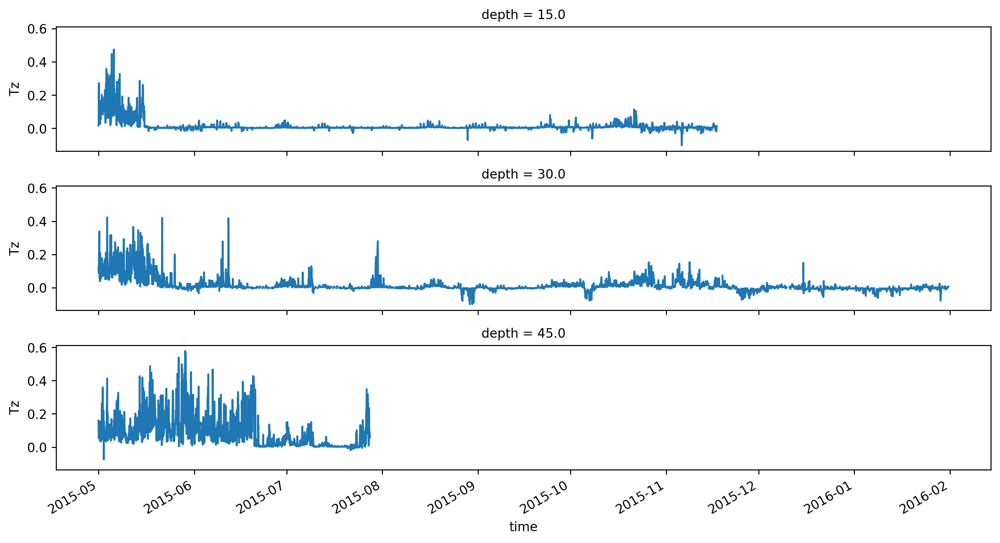

In [205]:
rama12.Tz.sel(time=slice("2015-May", None)).plot(row="depth", aspect=5, size=2)

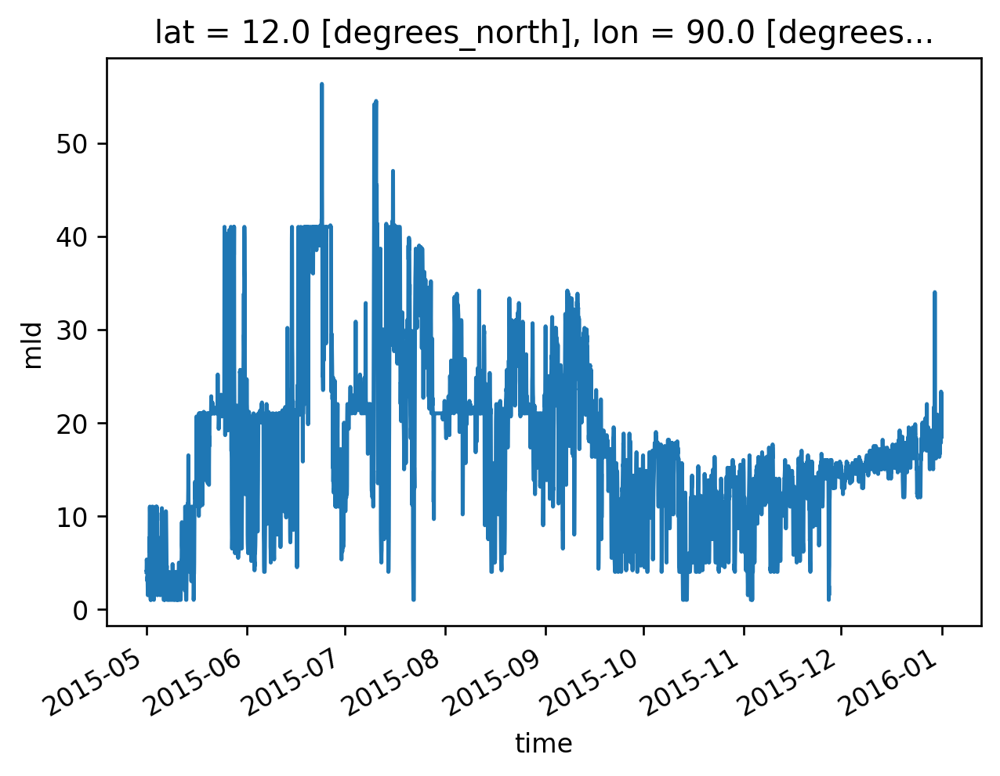

In [146]:
rama12.mld.sel(time=slice("2015-May", None)).plot()

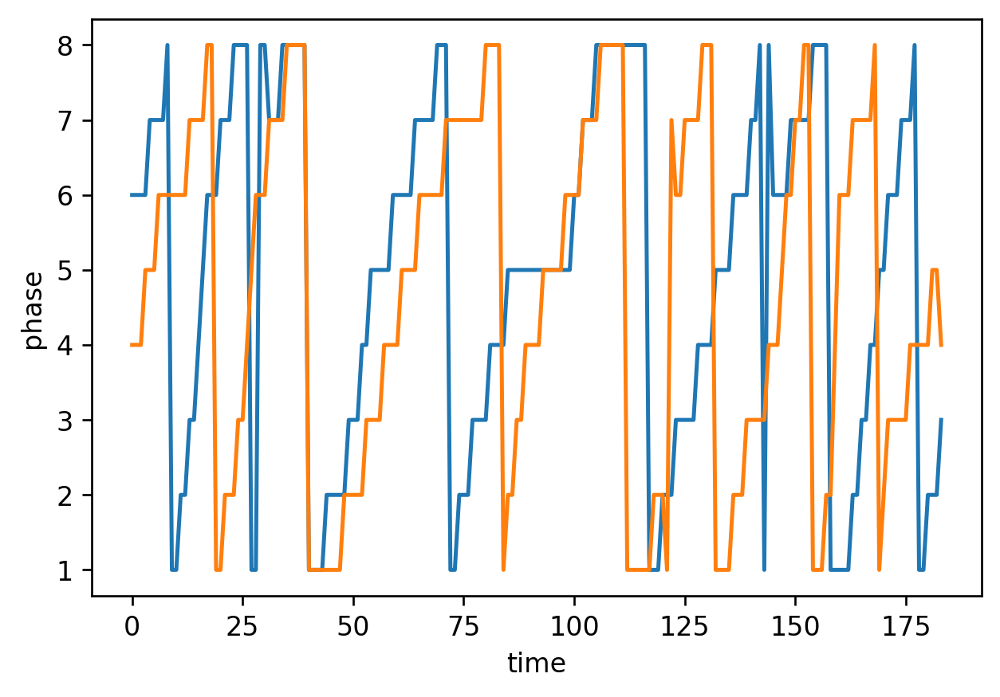

In [171]:
miso.sel(time="2014").phase.drop("time").plot()
miso.sel(time="2015").phase.drop("time").plot()

## MISO Index

In [93]:
import pandas as pd

In [167]:
def read_miso():
    import glob

    fnames = glob.glob("../datasets/miso/*_pc_MJJASO.dat")

    datas = []
    for filename in sorted(fnames):
        year = filename.split("/")[-1][:4]
        da = pd.read_csv(
            filename,
            index_col="time",
            names=["time", "MISO1", "MISO2", "phase"],
            sep="\s+",
        ).to_xarray()
        da["time"] = pd.date_range(f"{year}-05-01", f"{year}-10-31")
        # da.coords["year"] = int(year)
        datas.append(da)

    return xr.concat(datas, dim="time")


miso = read_miso()
miso

<xarray.Dataset>
Dimensions:  (time: 4232)
Coordinates:
  * time     (time) datetime64[ns] 1998-05-01 1998-05-02 ... 2020-10-31
Data variables:
    MISO1    (time) float64 -0.8109 -0.7575 -0.692 ... -2.086 -1.993 -1.951
    MISO2    (time) float64 0.7198 0.8922 1.129 1.257 ... -0.0156 0.2688 0.5145
    phase    (time) int64 5 6 6 6 6 6 6 6 7 7 7 7 7 ... 3 3 3 3 4 4 4 4 4 4 5 5

In [169]:
daily, _ = xr.align(rama12.resample(time="D").mean(), miso, join="inner")

In [170]:
phase_ave = daily.groupby(miso.phase).mean()

ValueError: the group variable's length does not match the length of this variable along its dimension

In [137]:
daily.Jq

<xarray.DataArray 'Jq' (time: 184, depth: 3)>
array([[-8.92830208e-01, -5.49883718e-01, -1.10939753e+01],
       [-5.44019058e-01, -9.51303460e-01, -9.76720106e+00],
       [-4.82597357e-01, -9.75831663e-01, -1.01330997e+01],
       [-1.03088196e+00, -1.27103996e+01, -2.04838178e+00],
       [-3.40237202e+00, -2.29304290e+00, -7.80409811e-01],
       [-2.51742552e+00, -3.72471759e+00, -3.62475663e+00],
       [-4.13572937e-01, -1.73679499e+00, -9.01804939e+00],
       [-2.20496302e-01, -1.58381563e+00, -7.57328992e-01],
       [-1.16573596e+00, -7.86005189e-01, -1.57913700e+00],
       [-1.35242442e+00, -9.15889850e-01, -8.50203731e-01],
       [-9.17478195e-01, -8.48574452e-01, -3.09220729e+00],
       [-5.85913791e-01, -7.31482410e+00, -1.39658560e+00],
       [-1.23318817e+00, -3.98127209e+00, -6.22008858e+00],
       [-1.93428364e+00, -2.96945525e+00, -4.63615987e+00],
       [-2.55121276e+00, -1.93827805e+00, -1.15953426e+01],
       [-3.58100933e-01, -2.92996901e+00, -1.77092528e+01],
       [-8.05862227e-01, -7.27796040e+00, -5.34922866e+01],
       [-9.76565813e-01, -1.08355727e+01, -8.80965649e+01],
       [ 9.81061322e+00, -7.72303066e+00, -5.14161248e+01],
       [-6.27540517e+00, -5.44234897e+00, -3.75835556e+01],
...
       [-1.56999660e+00, -5.61677499e-01,             nan],
       [-3.06277901e-01, -1.66639741e+00,             nan],
       [-3.09434812e-01, -1.15503846e+00,             nan],
       [-1.26327746e-01, -5.79686509e-01,             nan],
       [-1.15355224e-01, -2.44048881e-01,             nan],
       [-2.65601907e-01, -1.62966488e-01,             nan],
       [-9.85974017e-02, -1.30748735e-01,             nan],
       [-8.84773300e-02, -1.36616076e-01,             nan],
       [-8.93247036e-02, -6.67424356e-02,             nan],
       [-1.44313729e-01, -9.17319818e-02,             nan],
       [-2.24225580e-01, -7.39311873e-02,             nan],
       [-2.20847947e-01, -8.68021485e-02,             nan],
       [-3.05839533e-01, -1.02083883e-01,             nan],
       [-9.70139847e-02, -2.13128220e-01,             nan],
       [-2.16199542e-01, -3.22122664e-01,             nan],
       [ 2.34775798e-01, -2.62743121e-01,             nan],
       [-2.69140704e+00, -2.21798802e-01,             nan],
       [ 5.16814305e+00, -9.67963079e-02,             nan],
       [ 2.87357235e-02, -8.80858517e-02,             nan],
       [-3.56162003e+00, -1.32158317e-01,             nan]])
Coordinates:
  * depth    (depth) float64 15.0 30.0 45.0
  * time     (time) datetime64[ns] 2015-05-01 2015-05-02 ... 2015-10-31
    lat      float64 12.0
    lon      float64 90.0

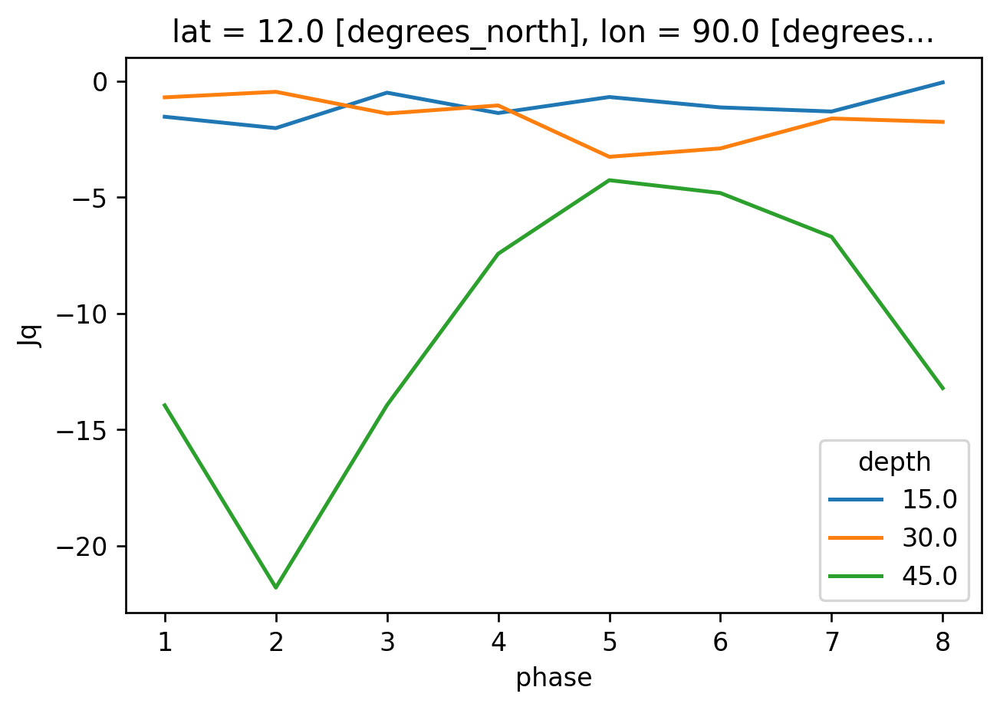

In [136]:
phase_ave.Jq.plot.line(x="phase")

In [207]:
daily.mld.groupby(miso.phase).std().plot()

ValueError: the group variable's length does not match the length of this variable along its dimension